In [24]:
import skimage           #import image processing package
import skimage.feature
import skimage.viewer
import sys
import matplotlib.pyplot as plt


/home/tunde/miniconda3/envs/python3_env/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


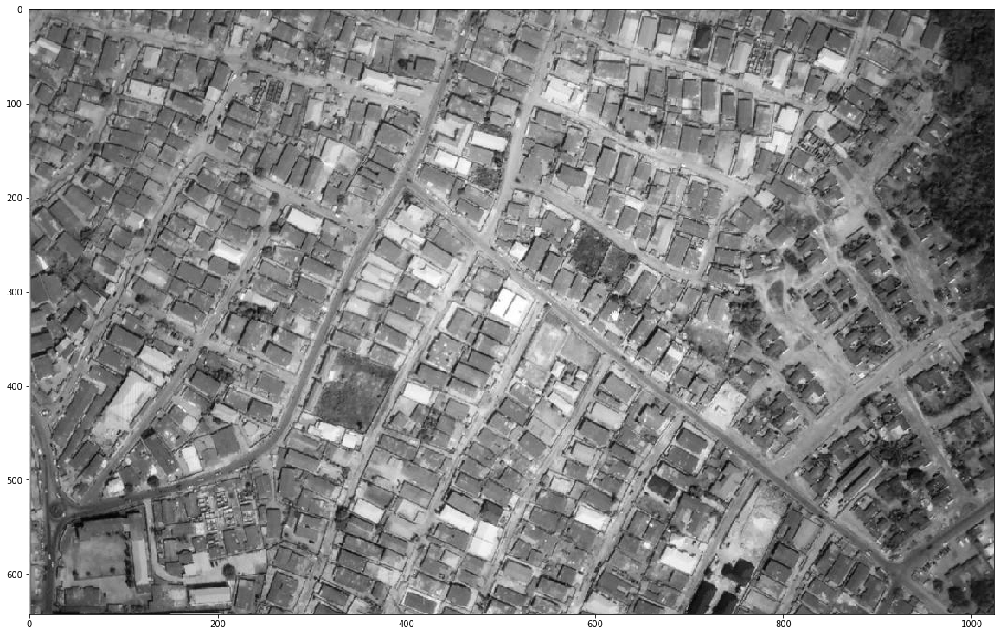

In [80]:
# load original image as grayscale
image_orig = skimage.io.imread(fname = "sat_image.jpeg")

# load and display original image as grayscale
image = skimage.io.imread(fname = "sat_image.jpeg", as_gray=True)

plt.figure(figsize=(20,14))
plt.imshow(image,cmap=plt.cm.gray)

(643, 1024)


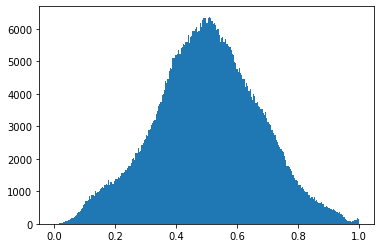

In [26]:
#plot histogram of image to show distribution of 256bits colors [0 - black, 1- white]
plt.hist(image.ravel(), bins=256);
print(image.shape)

distribution spans entire color range continuously, it is hard to find a threshold to convert the image to binary

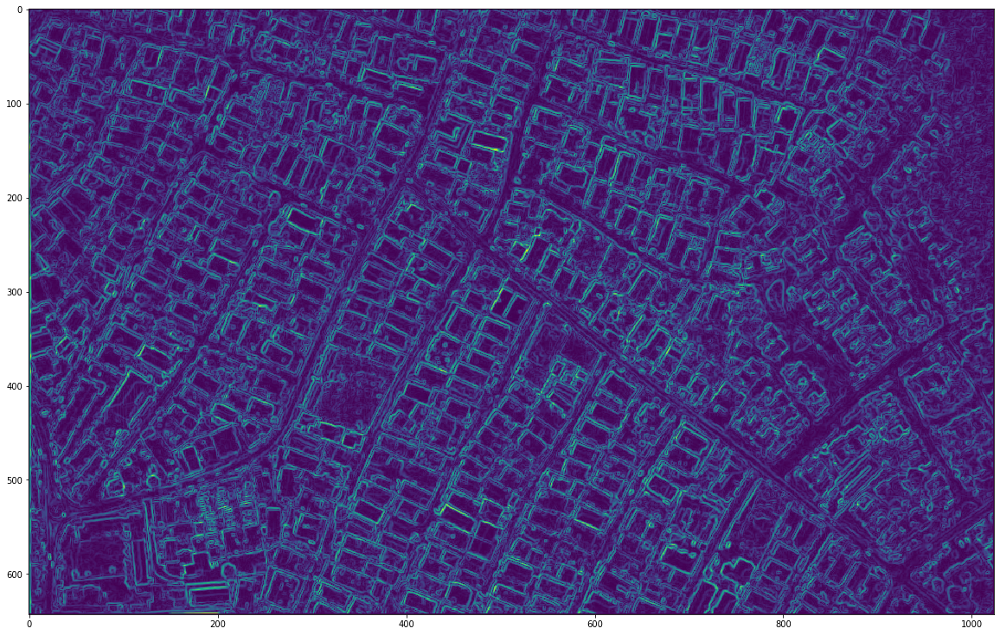

In [88]:
#use prewitt edge filter to highlight edges in the image. this should highlight buidling edges

edge_prew=skimage.filters.edges.prewitt(image)
plt.figure(figsize=(20,14))
plt.imshow(edge_prew)


(643, 1024)


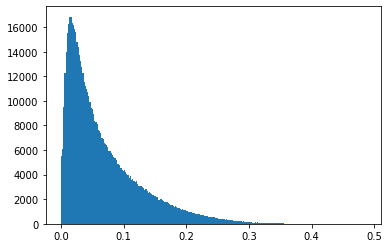

In [89]:
#plot histogram of image to show distribution of 256bits colors [0 - black, 1- white]
plt.hist(edge_prew.ravel(), bins=256);
print(edge_prew.shape)


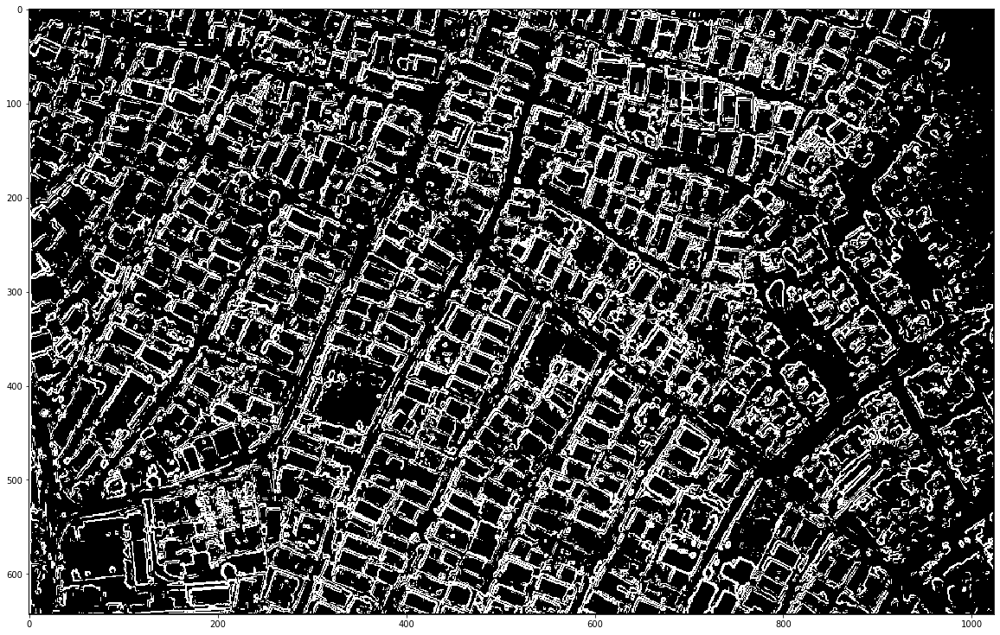

In [100]:
mask = edge_prew > skimage.filters.threshold_otsu(edge_prew)

plt.figure(figsize=(20,14))
clean_border = skimage.segmentation.clear_border(mask)

plt.imshow(clean_border, cmap='gray') 

In [108]:
#find contours with similar intensity in image
contours=skimage.measure.find_contours(clean_border,0.15,fully_connected="high" )
contours[0]

[]

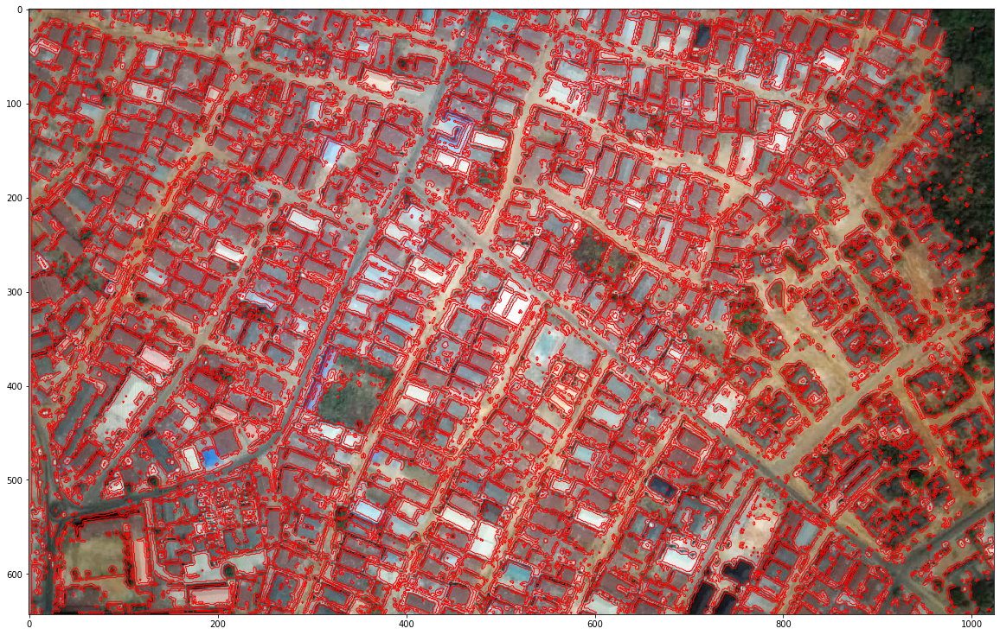

In [96]:
%matplotlib inline
plt.figure(figsize=(20,14))
plt.imshow(image_orig, cmap=plt.cm.gray)


for n, contour in enumerate(contours):
    plt.plot(contour[:, 1], contour[:, 0], "r",linewidth=1)


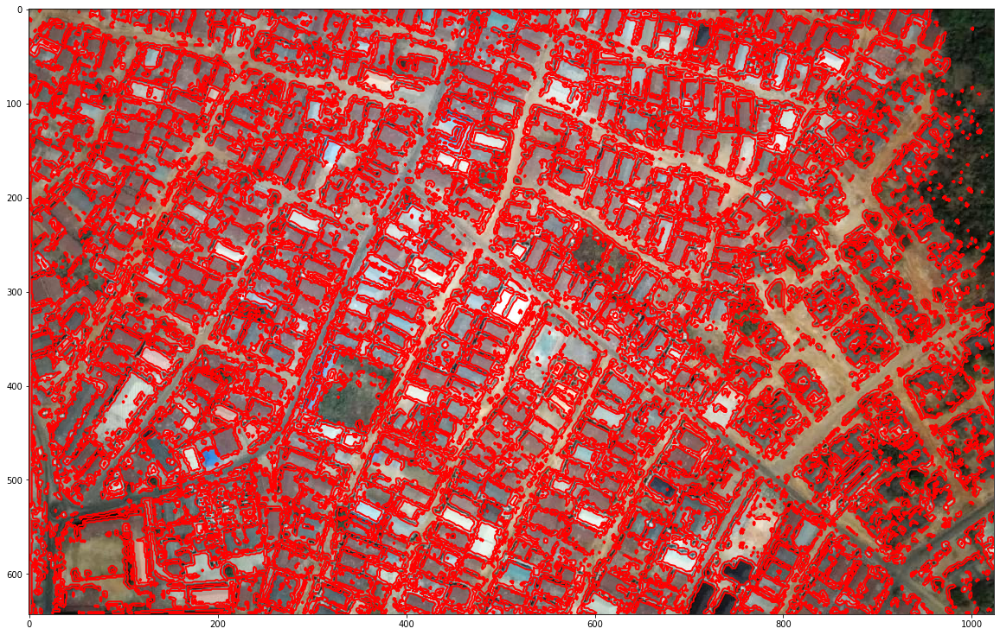

In [98]:
%matplotlib inline
plt.figure(figsize=(20,14))
plt.imshow(image_orig, cmap=plt.cm.gray)

for n, contour in enumerate(contours):
    coords = skimage.measure.approximate_polygon(contour, tolerance=0.5)
    plt.plot(coords[:, 1], coords[:, 0], '-r', linewidth=2)


(643, 1024)

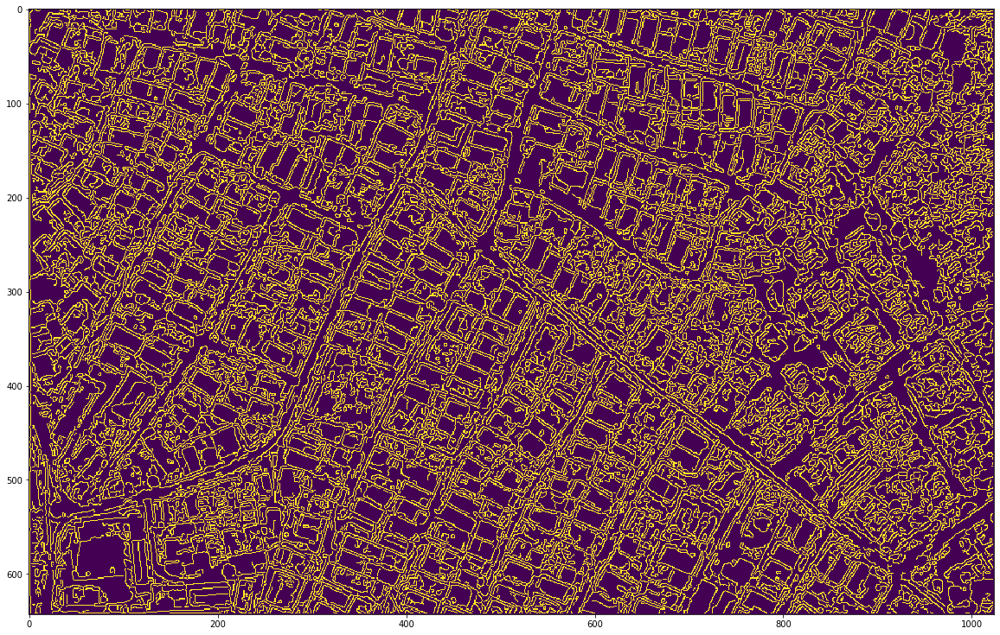

In [14]:
edges=skimage.feature.canny(image,sigma=0.7, low_threshold=0.006,high_threshold=0.7,use_quantiles=True)
plt.figure(figsize=(20,14))
plt.imshow(edges);
plt.imsave("edges.jpg",edges)
edges.shape

In [1]:
import numpy as np 
import cv2 
import matplotlib.pylab as plt

(643, 1024, 3)

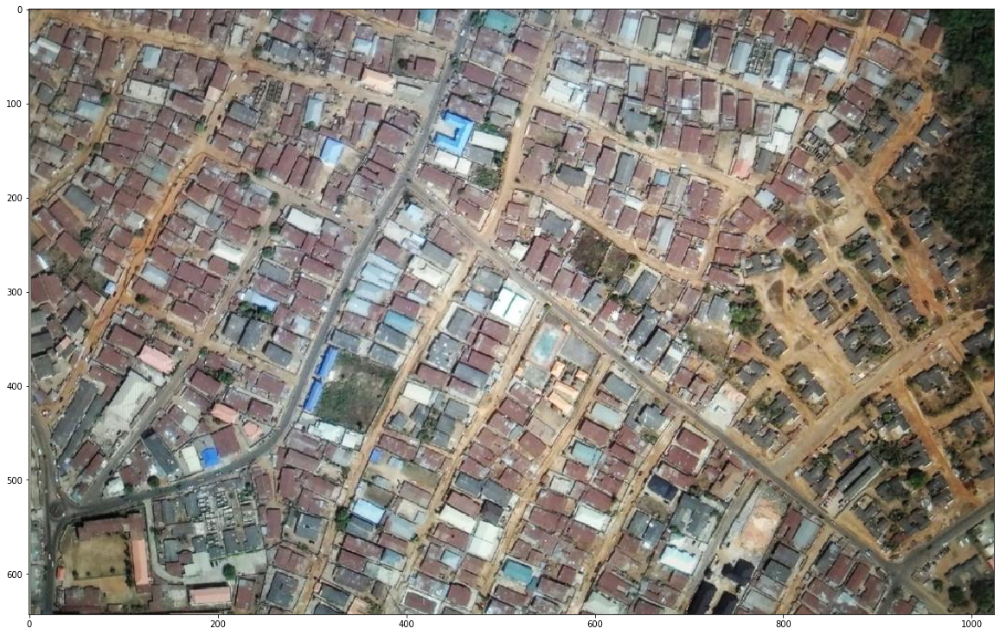

In [109]:
img2 = cv2.imread('sat_image.jpeg', cv2.IMREAD_COLOR) 
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,14))
plt.imshow(img2);
img2.shape

(643, 1024)

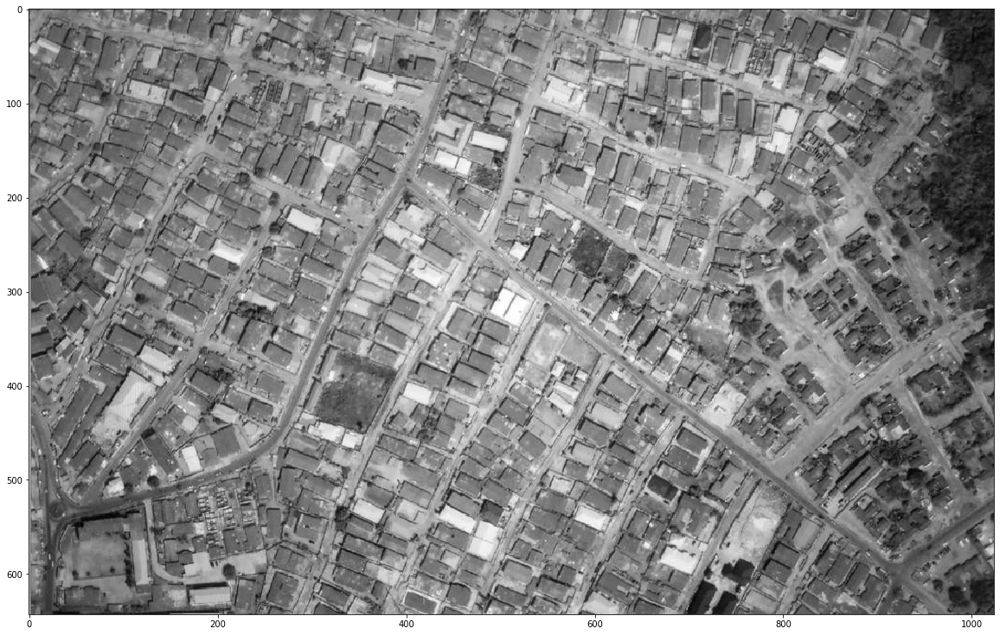

In [110]:
img_grey=cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(20,14))
plt.imshow(img_grey,cmap=plt.cm.gray);
img_grey.shape


(643, 1024, 3)

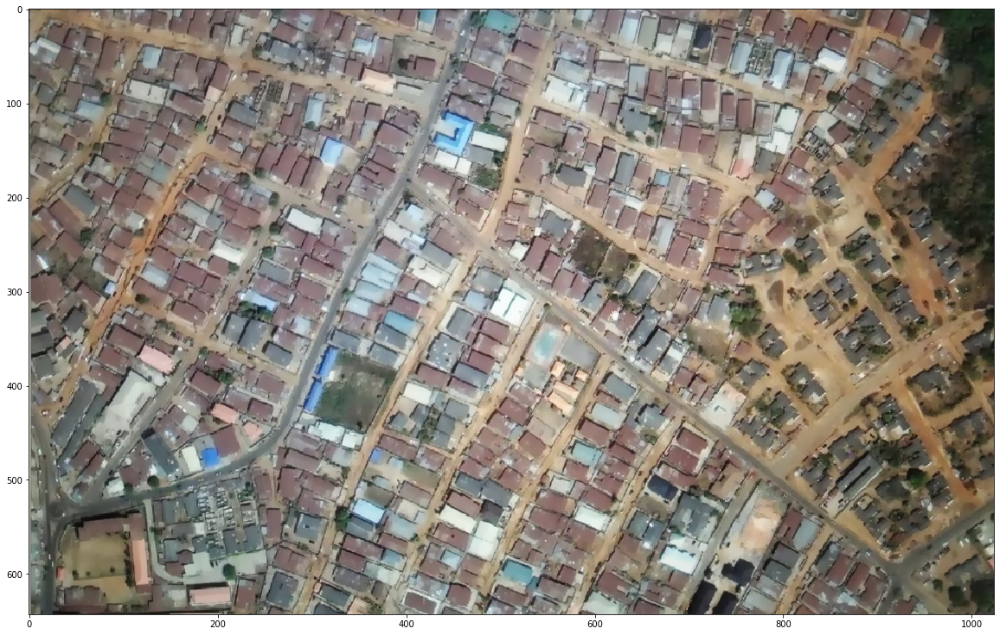

In [119]:
edges_P=cv2.edgePreservingFilter(img2,sigma_s=10, sigma_r=0.2) #Canny(img_grey,150, 250)
plt.figure(figsize=(20,14))
plt.imshow(edges_P);
edges_P.shape

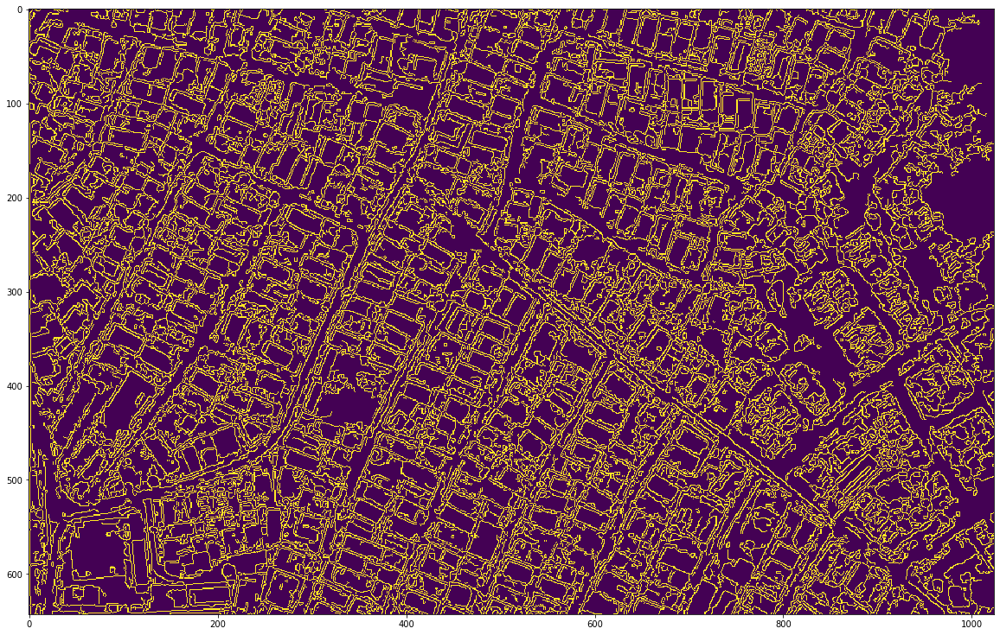

In [120]:
edges=cv2.Canny(edges_P,10, 200)
plt.figure(figsize=(20,14))
plt.imshow(edges)

In [6]:
_,threshold = cv2.threshold(edges, 100, 255,cv2.THRESH_BINARY) 

In [7]:
threshold

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [  0,   0, 255, ...,   0,   0,   0],
       [  0,   0, 255, ...,   0,   0,   0],
       [  0,   0, 255, ...,   0,   0,   0]], dtype=uint8)

In [8]:
contours,_=cv2.findContours(threshold, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE) 
contours

[array([[[152, 641]],
 
        [[151, 642]],
 
        [[150, 642]],
 
        [[151, 642]],
 
        [[152, 641]],
 
        [[153, 641]],
 
        [[154, 641]],
 
        [[155, 641]],
 
        [[156, 641]],
 
        [[157, 641]],
 
        [[158, 641]],
 
        [[159, 641]],
 
        [[160, 641]],
 
        [[161, 641]],
 
        [[162, 641]],
 
        [[163, 641]],
 
        [[164, 641]],
 
        [[165, 641]],
 
        [[166, 641]],
 
        [[167, 641]],
 
        [[168, 641]],
 
        [[169, 641]],
 
        [[170, 641]],
 
        [[171, 641]],
 
        [[172, 641]],
 
        [[173, 641]],
 
        [[174, 641]],
 
        [[175, 641]],
 
        [[176, 641]],
 
        [[177, 641]],
 
        [[178, 641]],
 
        [[179, 641]],
 
        [[180, 641]],
 
        [[181, 641]],
 
        [[182, 641]],
 
        [[183, 641]],
 
        [[184, 641]],
 
        [[185, 641]],
 
        [[186, 641]],
 
        [[187, 641]],
 
        [[188, 641]],
 
        [[189, 6

In [11]:
# Searching through every region selected to  
# find the required polygon. 
for cnt in contours : 
    area = cv2.contourArea(cnt) 
   
    # Shortlisting the regions based on there area. 
    if area > 500: 
        approx = cv2.approxPolyDP(cnt, 0.001 * cv2.arcLength(cnt, True), True) 
   
        # Checking if the no. of sides of the selected region is 7. 
        if(len(approx) < 6):  
            cv2.drawContours(img2, [approx], 0, (0, 0, 0), 2) 
   
# Showing the image along with outlined arrow. 
cv2.imshow('image2', img2)
cv2.waitKey(0)
cv2.destroyAllWindows() 